# Principle Landmarks, St. Paul's Cathedral

For this project, I have taken 20 photos of St. Paul's Cathedral in London. These photos are as close to identical as possible, but they are taken  over a period of 4 hours and by slight rotations around building.

In [1]:
# Ignore the Warning Messages
import warnings
warnings.filterwarnings('ignore')

In [2]:
from glob import glob 
from PIL import Image
from resizeimage import resizeimage
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

## Step 1. Processes all photos down to a size not exceeding 512 pixels in either width or height

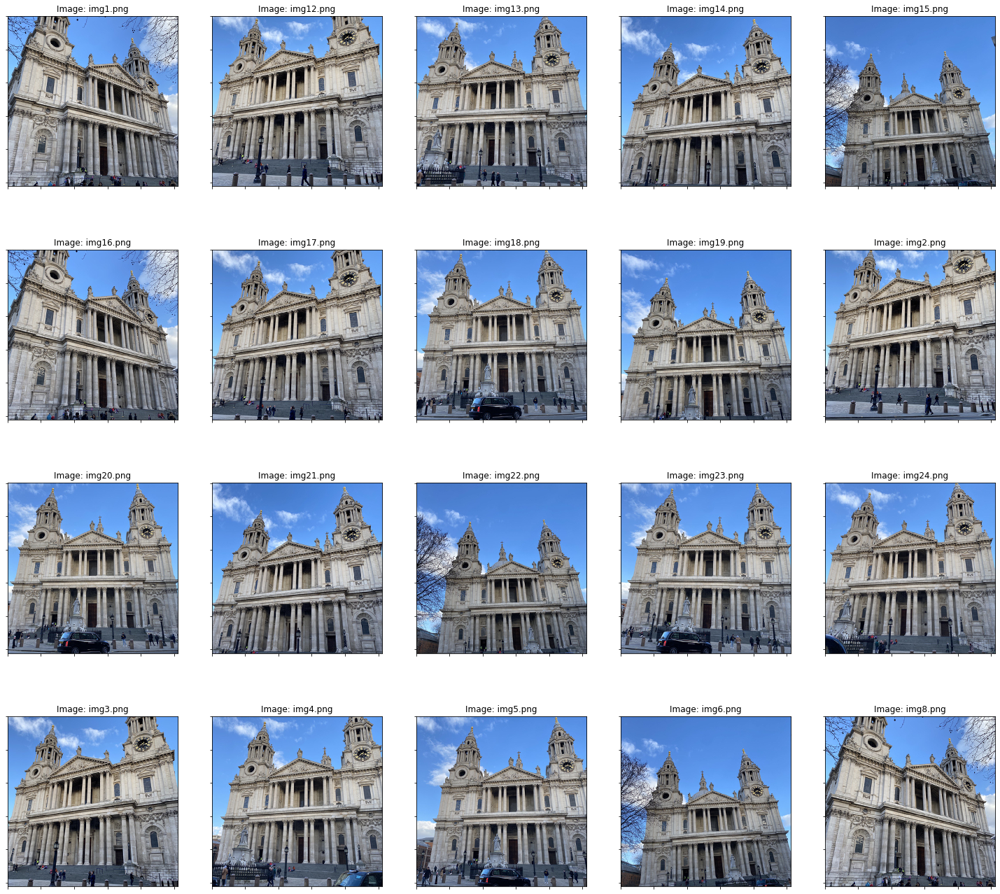

In [3]:
# Setting the size of the image to be reduced to
resize = [512, 512]
# Placeholder for resized images
resized_imgs=[]
# Placeholder for the flattened shape of the images
flattened_imgs =[]
# Sortting the images based on the time of when they were taken 
img_paths = sorted(glob("*.png"))
# Image count 
imgs_count=len(img_paths)

# Processes all photos down to a size not exceeding 512 pixels and convert the value to RGB 
for img_path in img_paths:
    with open(img_path, 'r+b') as f:
        with Image.open(f) as image:
            image.thumbnail(resize)
            # convert to RGB and resize
            cover = resizeimage.resize_cover(image.convert('RGB'), resize)
            # add resized images together
            resized_imgs.append(cover)
            # add flatted images together
            flattened_imgs.append(np.array(cover).flatten())
            
# Convert images to np.array type
images = np.asarray(flattened_imgs)
# Join a sequence of new np arrays of images
images = np.stack(i for i in images)

# Showing the orignal images after processing
plt.figure(figsize=(4 * 5, 5 * 9)) 
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)

for i, img in enumerate (resized_imgs):
    plt.subplot(9, 5, i + 1).set_yticklabels([])
    plt.subplot(9, 5, i + 1).set_xticklabels([])
    plt.title(f"Image: {img_paths[i]}")
    plt.imshow(img)

## Step 2. Using principal components analysis (PCA) project your images down to a 2 dimensional representation

### 1. Creating a PCA model 

Percentage of information covered by 2 dimensional representation 30.0%


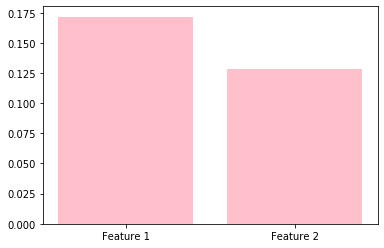

In [5]:
# Setting the dimensions to be 2
dimension = 2
# Instantiate PCA with set dimension
pca = PCA(n_components=dimension)
# Fitting the images to PCA and then transforming them, detemining transformed features
pca_tranform = pca.fit_transform(images)

# Finding out the variance ratios for the pca
feature_ratios = pca.explained_variance_ratio_
x_axis = []
counter = 1

# Showing the ratios for the features covered in 2D
for num in range(len(feature_ratios)):  
    x_axis.append (f"Feature {counter}")
    counter += 1
    
plt.bar(x_axis, feature_ratios, color = "pink")    
print(f"Percentage of information covered by 2 dimensional representation {round(feature_ratios[0]+feature_ratios[1],2)*100}%")

### 2. Showing the data after reducing them to 2 dimensional representation

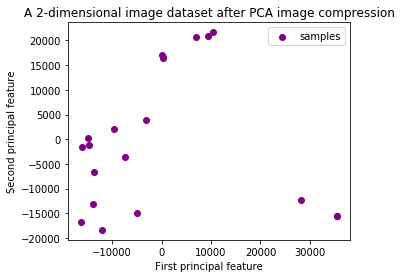

In [7]:
# Plotting the reduced data
plt.scatter(pca_tranform[:, 0], pca_tranform[:, 1], label="samples",  color ="purple")
plt.gca().set(aspect="equal",
              title="A 2-dimensional image dataset after PCA image compression",
              xlabel="First principal feature", ylabel="Second principal feature")

label = [idx for idx, image in enumerate(images)]


plt.legend()
plt.show()

#### Showing how specifically each of the imags lays on 2d

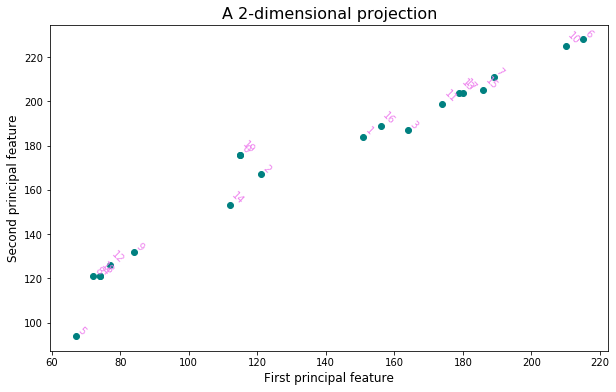

In [22]:
plt.figure(figsize=(10,6))

# Defining x and y values of each images in the 2D space
x = [image[0] for image in images]
y = [image[1] for image in images]

labels = [idx for idx, image in enumerate(images)]
plt.scatter(x,y, color = "teal")

for i in range(20):
    plt.annotate(str(labels[i]),xy=(x[i], y[i]), clip_on=True, rotation=-45, 
                    horizontalalignment='left', verticalalignment='bottom',
                    size=10, color = 'violet')

plt.xlabel('First principal feature', size=12)
plt.ylabel('Second principal feature', size=12)
plt.title('A 2-dimensional projection', size=16)
plt.show()

## Step 3. Reversing the reduced images and then comparing them with the original

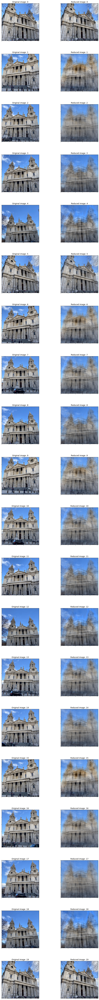

In [9]:
# Inversing the transformation
reduced_imgs = pca.inverse_transform(pca_tranform)
reduced_imgs = np.clip(reduced_imgs, 0, 255).astype('uint8')

# Converting the array to an image
converted_resized_imgs=[] # placeholder for the presentation of reduced images
for img in reduced_imgs:
    converted_resized_imgs.append(Image.fromarray(img.reshape(512,512,3), 'RGB'))

# Plotting the outputs next to each other
plt.figure(figsize=(5* 2, 5 * imgs_count))
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
# Number of presented  image
j=0
# A variable to check if the next image should reduced or not
reduced_next=False

# Presenting the output of original image and the reduced image
for i in range(0, imgs_count*2):
    if not reduced_next:
        plt.subplot(imgs_count, 2, i + 1).set_xticklabels([])
        plt.subplot(imgs_count, 2, i + 1).set_yticklabels([])
        plt.title(f"Original image :{j}")
        plt.imshow(resized_imgs[j])
        reduced_next=True
    else:
        plt.subplot(imgs_count, 2, i + 1).set_xticklabels([])
        plt.subplot(imgs_count, 2, i + 1).set_yticklabels([])
        plt.imshow(converted_resized_imgs[j])
        plt.title(f"Reduced image :{j}")
        reduced_next=False
        j+=1

## Step 4. Picking a point that is far away from any known location and plotting its reconstruction

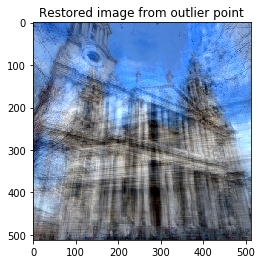

In [10]:
# Creatiing a random outlier point
outlier_point = np.array([30000,20000])

# Inversing transforming the point through pca
transformed_outlier = pca.inverse_transform(outlier_point)
transformed_outlier = np.clip(transformed_outlier, 0, 255).astype('uint8')
transformed_outlier = Image.fromarray(transformed_outlier.reshape(512,512,3), 'RGB')

# Showing the newly created image
plt.imshow(transformed_outlier)
plt.title("Restored image from outlier point")
plt.show()

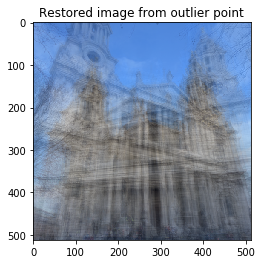

In [11]:
#Creating an outlier point
outlier_points_2 = np.array([10000, 10000])

# Inversing transforming the point through pca
transformed_outlier = pca.inverse_transform(outlier_points_2)
transformed_outlier = np.clip(transformed_outlier, 0, 255).astype('uint8')
transformed_outlier = Image.fromarray(transformed_outlier.reshape(512,512,3), 'RGB')

# Showing the newly created image
plt.imshow(transformed_outlier)
plt.title("Restored image from outlier point")
plt.show()

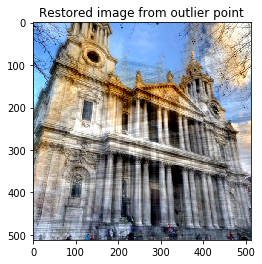

In [12]:
# Creating an outlier point
outlier_points_3= np.array([30000,-40000])

# Inversing transforming the point through pca
transformed_outlier = pca.inverse_transform(outlier_points_3)
transformed_outlier = np.clip(transformed_outlier, 0, 255).astype('uint8')
transformed_outlier = Image.fromarray(transformed_outlier.reshape(512,512,3), 'RGB')

# Showing the newly created image
plt.imshow(transformed_outlier)
plt.title("Restored image from outlier point")
plt.show()

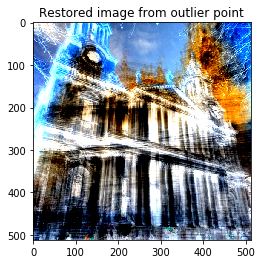

In [13]:
#Creating an outlier point
outlier_points_4 = np.array([-100000,-10000])

# Inversing transforming the point through pca
transformed_outlier = pca.inverse_transform(outlier_points_4)
transformed_outlier = np.clip(transformed_outlier, 0, 255).astype('uint8')
transformed_outlier = Image.fromarray(transformed_outlier.reshape(512,512,3), 'RGB')

# Showing the newly created image
plt.imshow(transformed_outlier)
plt.title("Restored image from outlier point")
plt.show()

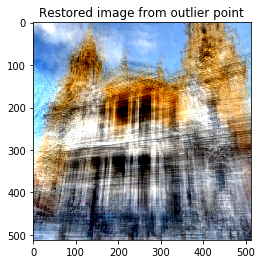

In [14]:
#Creating an outlier point
outlier_points_5= np.array([-30000,-50000])

# Inversing transforming the point through pca
transformed_outlier = pca.inverse_transform(outlier_points_5)
transformed_outlier = np.clip(transformed_outlier, 0, 255).astype('uint8')
transformed_outlier = Image.fromarray(transformed_outlier.reshape(512,512,3), 'RGB')

# Showing the newly created image
plt.imshow(transformed_outlier)
plt.title("Restored image from outlier point")
plt.show()

Based on the output of reconstraction of the outliers, the further is the outlier point from the main gathering, the more distorted is the image. Also, based on which direction is a new point, meaning how far away is the closest point to it, the distortion will vary. Fr example, the further it is from point for which color fature is well described, the could be a harsher color distrotion (such as more intense colors or concetrated coolors). For some new points, they will have components of multiple images (for exmaple two angles) as the nearest points to them have two different angles captured by the 2d PCA.

# Using principal components analysis (PCA) project your images down to a 3 dimensional representation

### 1. Creating a PCA model

Percentage of information covered by 3-dimensional representation 40.0%


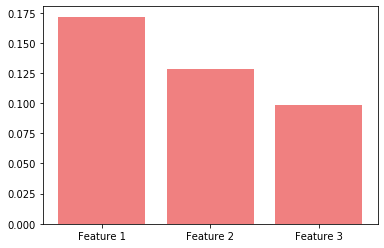

In [15]:
# Setting the dimensions to be 3
dimension_3 = 3
# Instantiate PCA with set dimension
pca = PCA(n_components=dimension_3)
# Fitting the images to PCA and then transforming them, detemining transformed features
pca_tranform_3 = pca.fit_transform(images)

# Finding out the variance ratios for the pca
feature_ratios_3 = pca.explained_variance_ratio_
x_axis = []
counter = 1

# Showing the ratios for the features covered in 3D
for num in range(len(feature_ratios_3)):  
    x_axis.append (f"Feature {counter}")
    counter += 1
    
plt.bar(x_axis, feature_ratios_3, color = "lightcoral")    
print(f"Percentage of information covered by 3-dimensional representation {round(feature_ratios_3[0]+feature_ratios_3[1]+feature_ratios_3[2],2)*100}%")



### 2. Showing the data after reducing them to 3-dimensional representation


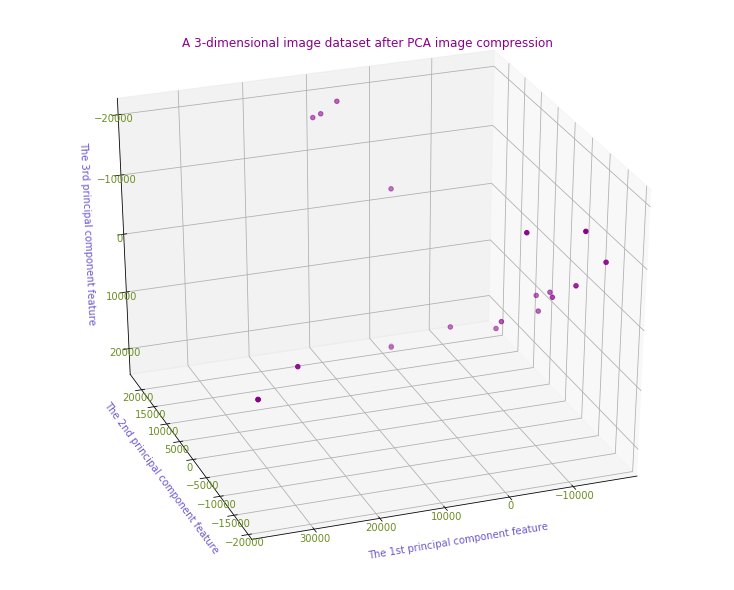

In [16]:
# Plotting the 3D data after reduction
plt.figure(1, figsize=(10, 8))
plt.clf()

fig = plt.figure(1, figsize=(10, 8))

ax = Axes3D(fig, elev=-150, azim=110)

ax.scatter(pca_tranform_3[:, 0], pca_tranform_3[:, 1],  pca_tranform_3[:, 2], label='samples', color = "darkmagenta")

# Setting axis and stylizing 
ax.set_title("A 3-dimensional image dataset after PCA image compression", color = "darkmagenta")
ax.set_xlabel("The 1st principal component feature", color = "slateblue")
ax.tick_params(axis='x', which='major', pad=-5, colors='olivedrab')
ax.set_ylabel("The 2nd principal component feature", color = "slateblue")
ax.tick_params(axis='y', which='major', pad=-5, colors='olivedrab')
ax.set_zlabel("The 3rd principal component feature", color = "slateblue")
ax.tick_params(axis='z', which='major', pad=-5, colors='olivedrab')

plt.show()

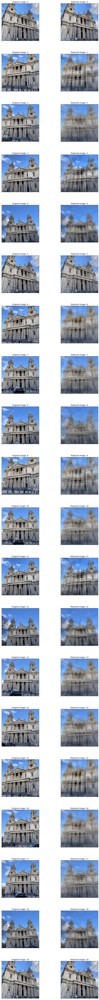

In [17]:
# Inversing the transformation
reduced_images_3d = pca.inverse_transform(pca_tranform_3)
reduced_images_3d = np.clip(reduced_images_3d, 0, 255).astype('uint8')
converted_resized_imgs_3d = []

# Converting the array back to an image
for img in reduced_images_3d:
    converted_resized_imgs_3d.append(Image.fromarray(img.reshape(512,512,3), 'RGB'))

# Plotting the outputs next to each other
plt.figure(figsize=(5* 2, 5 * imgs_count))
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
# The number of presented image
j=0

# A variable to check if the next image should reduced or not
next_reduced=False

# Presenting the output of original image and the reduced image
for i in range(0, imgs_count*2):
    if not next_reduced:
        plt.subplot(imgs_count, 2, i + 1).set_xticklabels([])
        plt.subplot(imgs_count, 2, i + 1).set_yticklabels([])
        plt.title(f"Original image :{j}")
        plt.imshow(resized_imgs[j])
        next_reduced=True
    else:
        plt.subplot(imgs_count, 2, i + 1).set_xticklabels([])
        plt.subplot(imgs_count, 2, i + 1).set_yticklabels([])
        plt.title(f"Reduced image :{j}")
        plt.imshow(converted_resized_imgs_3d[j])
        next_reduced=False
        j+=1

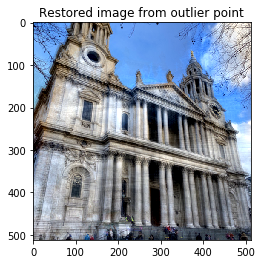

In [18]:
# Creating another outlier point
outlier_points_3d = np.array([50000,-10000, 0])

# Inversing transforming the point through pca

transformed_outlier_3d = pca.inverse_transform(outlier_points_3d)
transformed_outlier_3d = np.clip(transformed_outlier_3d, 0, 255).astype('uint8')
transformed_outlier_3d = Image.fromarray(transformed_outlier_3d.reshape(512,512,3), 'RGB')

# Showing the newly created image

plt.imshow(transformed_outlier_3d)
plt.title("Restored image from outlier point")
plt.show()

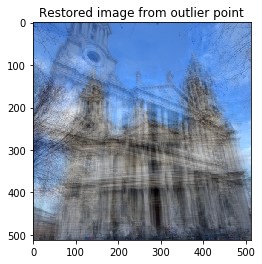

In [19]:
# Creating another outlier point
outlier_points_3d = np.array([20000,15000,-10000])

# Inversing transforming the point through pca
transformed_outlier_3d = pca.inverse_transform(outlier_points_3d)
transformed_outlier_3d = np.clip(transformed_outlier_3d, 0, 255).astype('uint8')
transformed_outlier_3d = Image.fromarray(transformed_outlier_3d.reshape(512,512,3), 'RGB')

# Showing the newly created image

plt.imshow(transformed_outlier_3d)
plt.title("Restored image from outlier point")
plt.show()

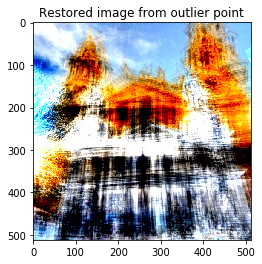

In [20]:
# Creating another outlier point
outlier_points_3d = np.array([-70000,-70000, 70000])

# Inversing transforming the point through pca

transformed_outlier_3d = pca.inverse_transform(outlier_points_3d)
transformed_outlier_3d = np.clip(transformed_outlier_3d, 0, 255).astype('uint8')
transformed_outlier_3d = Image.fromarray(transformed_outlier_3d.reshape(512,512,3), 'RGB')

# Showing the newly created image

plt.imshow(transformed_outlier_3d)
plt.title("Restored image from outlier point")
plt.show()

We got an art piece here!
This example shows that even for a data point very far away, we still get a reconstruction that captures the shape (even though it seems like a morphism of 2 images) and a general colour scheme by the high intensification. We can infer from the above examples that the first three eigenvectors capture the building's general colour scheme and shape. 

## PCA model component number vs Explained Variance/Information

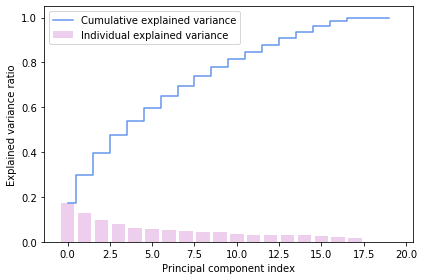

In [21]:
# inspiration for code: https://vitalflux.com/pca-explained-variance-concept-python-example/
# Instantiate PCA
pca = PCA()

# Determine transformed features
train_pca = pca.fit_transform(images)

# Determine explained variance of the pca
exp_var_pca = pca.explained_variance_ratio_

# Calculate the cumulative sum of eigenvalues in order to create step plot
# for visualizing the variance explained by each principal component
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# Plot results 
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance', color = 'plum')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance', color = 'cornflowerblue')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

The graph shows that we need at least four principal components to describe 50% of the information in our image dataset, while at least 14 components explain 90% of the data. However, while 2 and 3 principals describe only 30 and 40% of the information, they still perform well in retrieving the image's general shape and colour base. In our dataset, I have rotated around the building, and as I rotated in 4 hours, the sun's intensity has also changed. Hence, some buildings would have more warm base colours while others will have colder colours. This has resulted in some images having string gold colour while others have a paler colour selection. 

Although PCA with 2 or 3 components reduces the dimensionality of the data significantly, the projected images contain enough information that we, by just looking at photos, cab recognize the building in the image and to which angle of building this reduced image corresponds. Hence, using 3 (or 4 for even better accuracy) would be enough to train the classification algorithm instead of using all dimensions. Also, depending on what algorithm we pick, the results of this classification can be very accurate and efficient computability wise. However, as we see, the PCA's main weakness is that it tends to be highly affected by outliers in the data. In our data, it would be images taken from different angles. Hence, their reconstruction is not as accurate as reconstruction of the most frequent image angles. 